In [ ]:
pip install torch torchvision opencv-python matplotlib segment-anything


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 109.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 84.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [ ]:
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install opencv-python matplotlib torch torchvision
!pip install torch torchvision


  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-dqqs64qw
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-dqqs64qw
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done


In [ ]:
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install opencv-python matplotlib torch torchvision


  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-f94dei83
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-f94dei83
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done


In [ ]:
import requests

model_url = "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth"
sam_checkpoint = "sam_vit_h.pth"

print("Downloading SAM model. This may take a few minutes...")
response = requests.get(model_url, stream=True)

with open(sam_checkpoint, "wb") as f:
    for chunk in response.iter_content(chunk_size=1024):
        if chunk:
            f.write(chunk)

print("Download complete. Model saved as:", sam_checkpoint)


Download complete. Model saved as: sam_vit_h.pth


In [ ]:
import torch
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator

device = "cuda" if torch.cuda.is_available() else "cpu"
model_type = "vit_h"

# Load the SAM model correctly
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
mask_generator = SamAutomaticMaskGenerator(sam)

print("Model loaded successfully on", device)


/usr/local/lib/python3.11/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


Model loaded successfully on cuda


In [ ]:
pip install pytesseract


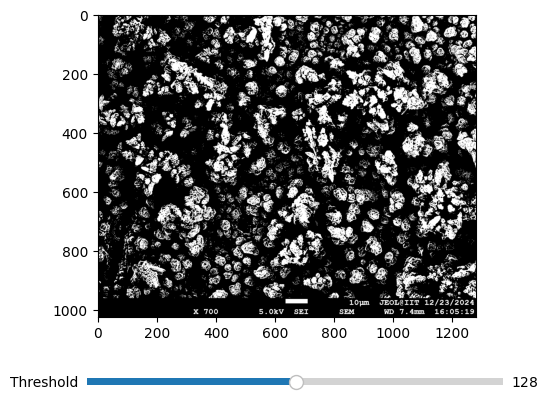

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider

# Load the image
image_path = "/content/700x.jpg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Create a figure and axis for displaying the image
fig, ax = plt.subplots()
plt.subplots_adjust(bottom=0.25)

# Apply initial thresholding
threshold_init = 128
_, binary_image = cv2.threshold(image, threshold_init, 255, cv2.THRESH_BINARY)
image_display = ax.imshow(binary_image, cmap='gray')

# Slider setup
ax_slider = plt.axes([0.2, 0.1, 0.65, 0.03])
slider = Slider(ax_slider, 'Threshold', 0, 255, valinit=threshold_init, valstep=1)

# Update function for slider
def update(val):
    threshold = int(slider.val)
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)
    image_display.set_data(binary_image)
    fig.canvas.draw_idle()

# Connect the slider to the update function
slider.on_changed(update)

plt.show()


Threshold: 128, Total white pixel area: 17338.0 pixels, Coverage: 16.31%


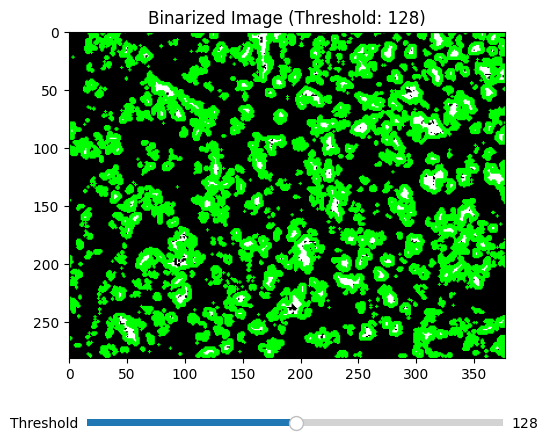

In [ ]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider

# Load the grayscale image
image_path = "/content/download (1).png"  # Update if needed
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Create a figure for displaying results
fig, ax = plt.subplots()
plt.subplots_adjust(bottom=0.2)  # Leave space for the slider

# Initial threshold
initial_threshold = 128

def process_image(threshold):
    # Apply binary thresholding
    _, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)

    # Find contours
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Calculate area of each contour
    areas = [cv2.contourArea(cnt) for cnt in contours]
    total_area = sum(areas)

    # Display results
    ax.clear()
    ax.imshow(binary_image, cmap="gray")
    ax.set_title(f"Binarized Image (Threshold: {threshold})")

    # Draw contours on a copy of the binary image
    contour_image = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)

    # Show the image with contours
    ax.imshow(contour_image)

    # Print stats
    total_pixels = binary_image.size
    area_percentage = (total_area / total_pixels) * 100
    print(f"Threshold: {threshold}, Total white pixel area: {total_area} pixels, Coverage: {area_percentage:.2f}%")

    fig.canvas.draw_idle()

# Initial display
process_image(initial_threshold)

# Create a slider for threshold adjustment
ax_slider = plt.axes([0.2, 0.05, 0.65, 0.03])
slider = Slider(ax_slider, "Threshold", 0, 255, valinit=initial_threshold, valstep=1)

# Update function for slider
def update(val):
    process_image(int(slider.val))

slider.on_changed(update)

plt.show()


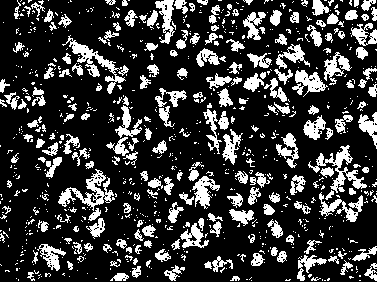

Threshold: 128
Total white pixel area: 17338.0 pixels
Percentage of image covered by dendrites: 16.31%
Areas of individual dendrites in pixels: [0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 3.0, 0.0, 0.0, 6.5, 0.0, 0.0, 3.5, 18.5, 0.0, 0.0, 0.0, 1.0, 6.0, 0.0, 78.0, 0.0, 1.0, 4.0, 18.0, 0.0, 0.0, 0.0, 2.0, 1.5, 1.0, 0.0, 0.0, 0.0, 0.0, 2.0, 4.5, 0.0, 0.5, 0.0, 60.0, 100.0, 0.0, 0.0, 76.0, 0.0, 0.0, 0.0, 27.5, 0.0, 16.5, 22.5, 46.0, 12.0, 1.0, 0.0, 0.0, 4.5, 0.0, 15.0, 0.0, 0.0, 31.5, 0.0, 101.5, 19.0, 211.5, 8.5, 7.5, 1.0, 5.0, 0.0, 1.0, 0.0, 103.0, 0.0, 0.0, 0.0, 0.0, 15.0, 68.0, 1.0, 0.0, 0.0, 1.5, 0.5, 0.0, 2.5, 0.0, 18.0, 0.0, 3.5, 0.0, 86.0, 2.0, 0.5, 1.0, 0.0, 0.0, 36.0, 0.0, 17.5, 0.0, 107.5, 0.0, 0.0, 0.0, 0.0, 21.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 27.5, 297.5, 1.0, 35.0, 0.0, 0.0, 34.5, 0.0, 4.0, 50.0, 30.0, 0.0, 0.5, 0.0, 32.5, 54.5, 0.0, 0.0, 0.0, 0.0, 0.0, 16.0, 0.0, 0.0, 0.0, 0.0, 1.0, 36.5, 0.5, 19.0, 0.0, 1.5, 1.5, 0.0, 9.0, 0.0, 0.0, 0.0, 0.0, 3.0, 4.5, 0.0, 0.0, 0.5, 0.0, 0.5, 0.0

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Load the image
image_path = "/content/download.png"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply thresholding to binarize the image
threshold = 128
_, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)

# Find contours of the dendrites
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Calculate area of each dendrite
areas = [cv2.contourArea(cnt) for cnt in contours]

total_white_pixels = sum(areas)
total_pixels = binary_image.size
area_percentage = (total_white_pixels / total_pixels) * 100

# Display results
cv2_imshow(binary_image)
print(f"Threshold: {threshold}")
print(f"Total white pixel area: {total_white_pixels} pixels")
print(f"Percentage of image covered by dendrites: {area_percentage:.2f}%")
print("Areas of individual dendrites in pixels:", areas)


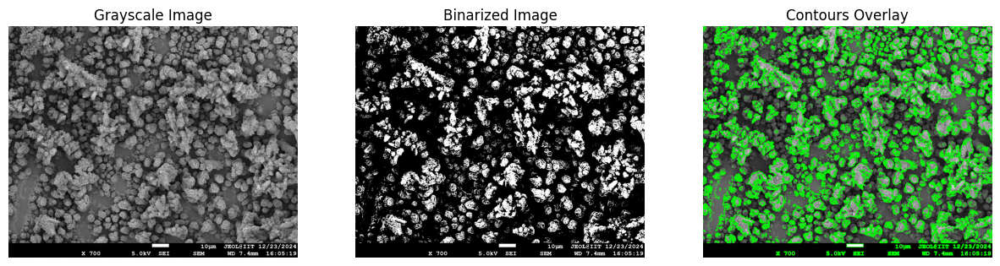

Total white pixel area: 276325.0 pixels
Percentage of image covered by dendrites: 21.08%
Areas of individual dendrites in pixels: [10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 243.0, 311.0, 254.0, 87.0, 70.0, 111.5, 87.0, 85.0, 111.5, 123.5, 62.0, 83.5, 157.0, 122.5, 62.0, 104.5, 61.0, 93.5, 157.0, 83.5, 157.0, 157.0, 61.0, 211.5, 92.0, 70.0, 70.0, 91.0, 174.0, 184.0, 104.5, 87.5, 157.0, 87.5, 80.5, 87.5, 87.5, 62.0, 74.5, 157.0, 62.0, 48.0, 48.0, 1036.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 1.0, 0.0, 0.0, 0.0, 7.0, 2.0, 1.5, 0.0, 0.0, 0.0, 20.0, 0.0, 0.0, 0.0, 1.5, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 1.5, 0.0, 1.0, 0.0, 12.0, 0.0, 0.0, 0.0, 0.0, 0.0, 71.5, 0.5, 1.5, 0.0, 0.5, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.0, 82.5, 23.0, 0.0, 0.0, 3.5, 0.0, 1.5, 0.0, 1.5, 0.0, 0.0, 0.0, 12.5, 0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 0.0, 0.0, 18.0, 0.0, 1.5, 0.0, 0.0, 0.5, 0.0, 8.0, 0.

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Load the image
image_path = "/content/700x.jpg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply thresholding to binarize the image
threshold = 128
_, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)

# Find contours of the dendrites
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Calculate area of each dendrite
areas = [cv2.contourArea(cnt) for cnt in contours]

total_white_pixels = sum(areas)
total_pixels = binary_image.size
area_percentage = (total_white_pixels / total_pixels) * 100

# Draw contours on a copy of the original image
contour_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)

# Display grayscale, binarized, and contour images side by side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Grayscale Image')
axes[0].axis('off')

axes[1].imshow(binary_image, cmap='gray')
axes[1].set_title('Binarized Image')
axes[1].axis('off')

axes[2].imshow(contour_image)
axes[2].set_title('Contours Overlay')
axes[2].axis('off')

plt.show()

# Display results
print(f"Total white pixel area: {total_white_pixels} pixels")
print(f"Percentage of image covered by dendrites: {area_percentage:.2f}%")
print("Areas of individual dendrites in pixels:", areas)


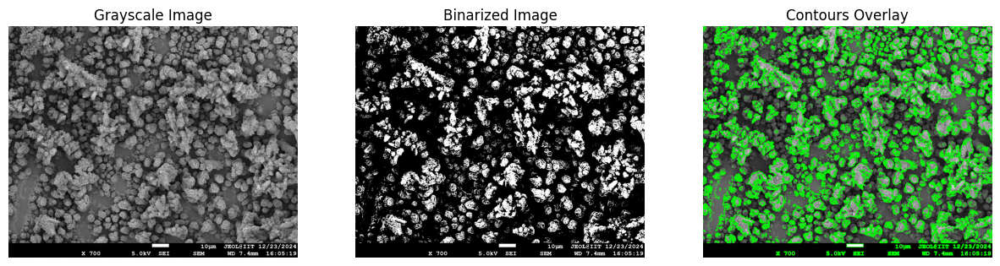

Total white pixel area: 273189.00 pixels
Percentage of image covered by dendrites: 20.84%
Areas of individual dendrites in pixels: [10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 243.0, 311.0, 254.0, 87.0, 70.0, 111.5, 87.0, 85.0, 111.5, 123.5, 62.0, 83.5, 157.0, 122.5, 62.0, 104.5, 61.0, 93.5, 157.0, 83.5, 157.0, 157.0, 61.0, 211.5, 92.0, 70.0, 70.0, 91.0, 174.0, 184.0, 104.5, 87.5, 157.0, 87.5, 80.5, 87.5, 87.5, 62.0, 74.5, 157.0, 62.0, 48.0, 48.0, 1036.0, 20.0, 12.0, 71.5, 82.5, 23.0, 12.5, 18.0, 38.0, 15.5, 34.5, 37.0, 18.0, 135.0, 95.0, 335.0, 39.0, 37.0, 1057.0, 38.5, 165.0, 63.0, 30.0, 887.0, 16.0, 66.0, 486.5, 47.0, 19.5, 75.0, 131.0, 304.5, 37.0, 809.0, 432.5, 24.0, 13.5, 23.0, 1115.5, 436.0, 352.0, 426.5, 48.5, 13.5, 244.0, 49.5, 657.0, 274.0, 41.0, 11.5, 53.5, 1408.5, 181.0, 472.5, 182.0, 15.0, 64.5, 136.5, 1377.0, 23.0, 17.5, 39.5, 75.5, 890.5, 239.0, 13.5, 283.0, 74.0, 12.0, 18.0, 19.5, 18.0, 16.5, 125.5, 1372.0, 117.5, 34.0, 10.0, 559.5, 285.5, 18.5, 21.0, 39.5, 18.0, 11.5, 1480.0, 

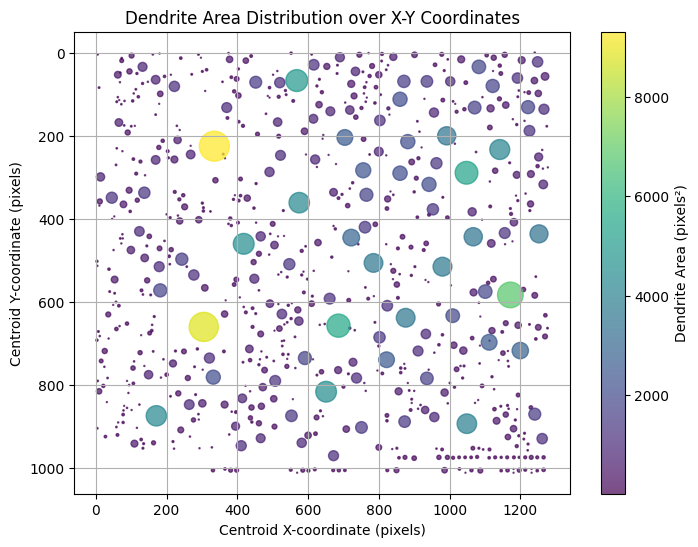

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Load the image
image_path = "/content/700x.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply thresholding to binarize the image
threshold = 128
_, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)

# Find contours of the dendrites
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Initialize lists for area and centroids
areas = []
centroids_x = []
centroids_y = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area < 10:  # Ignore noise
        continue

    M = cv2.moments(cnt)
    if M['m00'] != 0:
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        centroids_x.append(cx)
        centroids_y.append(cy)
        areas.append(area)

total_white_pixels = sum(areas)
total_pixels = binary_image.size
area_percentage = (total_white_pixels / total_pixels) * 100

# Draw contours on a copy of the original image
contour_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)

# Display grayscale, binarized, and contour images side by side
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Grayscale Image')
axes[0].axis('off')

axes[1].imshow(binary_image, cmap='gray')
axes[1].set_title('Binarized Image')
axes[1].axis('off')

axes[2].imshow(contour_image)
axes[2].set_title('Contours Overlay')
axes[2].axis('off')

plt.show()

# Display results
print(f"Total white pixel area: {total_white_pixels:.2f} pixels")
print(f"Percentage of image covered by dendrites: {area_percentage:.2f}%")
print("Areas of individual dendrites in pixels:", areas)

# Scatter plot: Area vs Centroid (X, Y)
plt.figure(figsize=(8, 6))
scatter = plt.scatter(centroids_x, centroids_y, s=np.array(areas)*0.05, c=areas, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label="Dendrite Area (pixels²)")
plt.xlabel("Centroid X-coordinate (pixels)")
plt.ylabel("Centroid Y-coordinate (pixels)")
plt.title("Dendrite Area Distribution over X-Y Coordinates")
plt.gca().invert_yaxis()  # Image coordinates usually have origin at top-left
plt.grid(True)
plt.show()


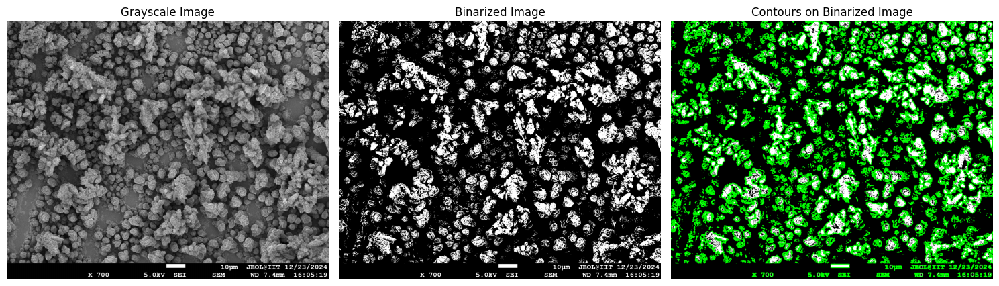

Total dendrite pixel area: 273189.00 pixels
Image area covered by dendrites: 20.84%
Individual dendrite areas (pixels²): [10.0, 10.0, 10.0, 10.0, 10.0, 10.0, 243.0, 311.0, 254.0, 87.0, 70.0, 111.5, 87.0, 85.0, 111.5, 123.5, 62.0, 83.5, 157.0, 122.5, 62.0, 104.5, 61.0, 93.5, 157.0, 83.5, 157.0, 157.0, 61.0, 211.5, 92.0, 70.0, 70.0, 91.0, 174.0, 184.0, 104.5, 87.5, 157.0, 87.5, 80.5, 87.5, 87.5, 62.0, 74.5, 157.0, 62.0, 48.0, 48.0, 1036.0, 20.0, 12.0, 71.5, 82.5, 23.0, 12.5, 18.0, 38.0, 15.5, 34.5, 37.0, 18.0, 135.0, 95.0, 335.0, 39.0, 37.0, 1057.0, 38.5, 165.0, 63.0, 30.0, 887.0, 16.0, 66.0, 486.5, 47.0, 19.5, 75.0, 131.0, 304.5, 37.0, 809.0, 432.5, 24.0, 13.5, 23.0, 1115.5, 436.0, 352.0, 426.5, 48.5, 13.5, 244.0, 49.5, 657.0, 274.0, 41.0, 11.5, 53.5, 1408.5, 181.0, 472.5, 182.0, 15.0, 64.5, 136.5, 1377.0, 23.0, 17.5, 39.5, 75.5, 890.5, 239.0, 13.5, 283.0, 74.0, 12.0, 18.0, 19.5, 18.0, 16.5, 125.5, 1372.0, 117.5, 34.0, 10.0, 559.5, 285.5, 18.5, 21.0, 39.5, 18.0, 11.5, 1480.0, 13.0, 11.0

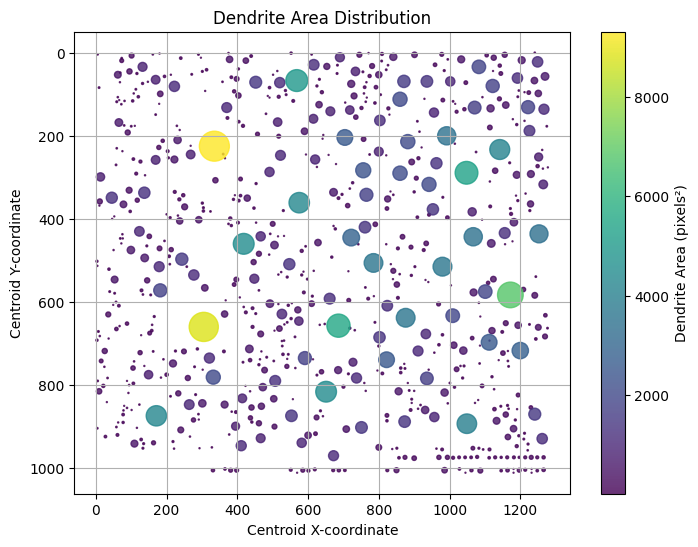

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Load image as grayscale
image_path = "/content/700x.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Threshold to binarize the image
threshold = 128
_, binary_image = cv2.threshold(image, threshold, 255, cv2.THRESH_BINARY)

# Find external contours
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Prepare data for area and centroid analysis
areas = []
centroids_x = []
centroids_y = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area < 10:  # Ignore tiny noise
        continue
    M = cv2.moments(cnt)
    if M["m00"] != 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
        centroids_x.append(cx)
        centroids_y.append(cy)
        areas.append(area)

# Calculate coverage percentage
total_white_pixels = sum(areas)
total_pixels = binary_image.size
area_percentage = (total_white_pixels / total_pixels) * 100

# Draw contours on binarized image (convert to BGR)
binary_bgr = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)
cv2.drawContours(binary_bgr, contours, -1, (0, 255, 0), 2)  # Green contours

# Display grayscale, binarized, and contour images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Grayscale Image')
axes[0].axis('off')

axes[1].imshow(binary_image, cmap='gray')
axes[1].set_title('Binarized Image')
axes[1].axis('off')

axes[2].imshow(binary_bgr)
axes[2].set_title('Contours on Binarized Image')
axes[2].axis('off')

plt.tight_layout()
plt.show()

# Print statistics
print(f"Total dendrite pixel area: {total_white_pixels:.2f} pixels")
print(f"Image area covered by dendrites: {area_percentage:.2f}%")
print("Individual dendrite areas (pixels²):", areas)

# Scatter plot of dendrite areas vs (X, Y) positions
plt.figure(figsize=(8, 6))
scatter = plt.scatter(centroids_x, centroids_y, s=np.array(areas)*0.05, c=areas, cmap='viridis', alpha=0.8)
plt.colorbar(scatter, label='Dendrite Area (pixels²)')
plt.xlabel('Centroid X-coordinate')
plt.ylabel('Centroid Y-coordinate')
plt.title('Dendrite Area Distribution')
plt.gca().invert_yaxis()  # Match image origin (top-left)
plt.grid(True)
plt.show()


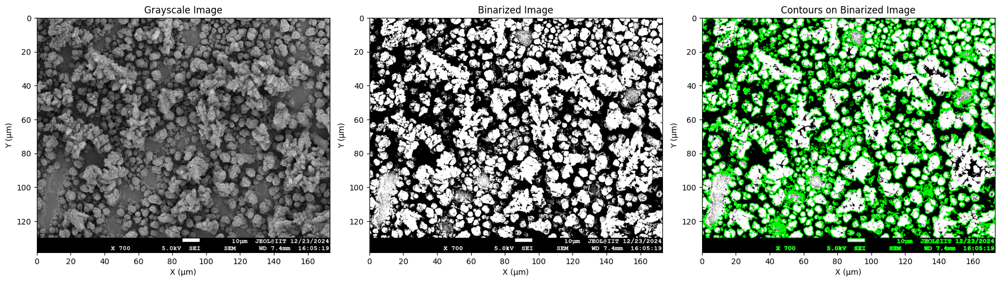

Total dendrite area: 8536.20 µm²
Image area covered by dendrites: 35.66%
Individual dendrite areas (µm²): [48.74, 69.9, 57.62, 45.02, 55.0, 363.75, 52.19, 60.45, 261.91, 219.52, 141.98, 580.75, 169.81, 67.37, 473.7, 117.2, 48.63, 120.42, 41.53, 54.98, 41.96, 146.95, 291.29, 50.55, 933.26, 103.78, 341.89, 168.31, 85.03, 78.5, 55.81, 81.49, 59.01, 411.83, 122.89, 56.23, 1486.19, 147.12, 51.08, 477.9, 47.05, 247.61]


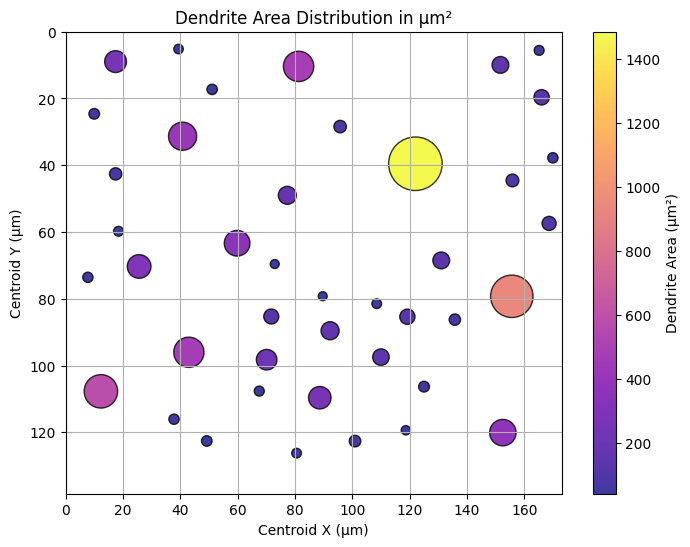

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Conversion constants
PIXEL_TO_UM = 10 / 74  # µm per pixel
PIXEL_AREA_TO_UM2 = (PIXEL_TO_UM) ** 2  # µm² per pixel²

# Load grayscale image
image_path = "/content/700x.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Convert pixel dimensions to µm
height_px, width_px = image.shape
width_um = width_px * PIXEL_TO_UM
height_um = height_px * PIXEL_TO_UM

# Threshold to binarize the image
_, binary_image = cv2.threshold(image, 92, 255, cv2.THRESH_BINARY)

# Find external contours
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Analyze contours
areas_px = []
areas_um2 = []
centroids_x_um = []
centroids_y_um = []

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area < 2261:
        continue
    M = cv2.moments(cnt)
    if M["m00"] != 0:
        cx = M["m10"] / M["m00"]
        cy = M["m01"] / M["m00"]
        centroids_x_um.append(cx * PIXEL_TO_UM)
        centroids_y_um.append(cy * PIXEL_TO_UM)
        areas_px.append(area)
        areas_um2.append(area * PIXEL_AREA_TO_UM2)

# Coverage stats
total_white_pixels = sum(areas_px)
total_pixels = binary_image.size
coverage_percent = (total_white_pixels / total_pixels) * 100

# Convert to BGR for contour display
binary_bgr = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)
cv2.drawContours(binary_bgr, contours, -1, (0, 255, 0), 2)

# Plot all images with identical µm axes
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Common extent for all images in µm
extent = [0, width_um, height_um, 0]

axes[0].imshow(image, cmap='gray', extent=extent)
axes[0].set_title('Grayscale Image')
axes[0].set_xlabel('X (µm)')
axes[0].set_ylabel('Y (µm)')
axes[0].set_xlim([0, width_um])
axes[0].set_ylim([height_um, 0])

axes[1].imshow(binary_image, cmap='gray', extent=extent)
axes[1].set_title('Binarized Image')
axes[1].set_xlabel('X (µm)')
axes[1].set_ylabel('Y (µm)')
axes[1].set_xlim([0, width_um])
axes[1].set_ylim([height_um, 0])

axes[2].imshow(binary_bgr, extent=extent)
axes[2].set_title('Contours on Binarized Image')
axes[2].set_xlabel('X (µm)')
axes[2].set_ylabel('Y (µm)')
axes[2].set_xlim([0, width_um])
axes[2].set_ylim([height_um, 0])

plt.tight_layout()
plt.show()

# Display stats
print(f"Total dendrite area: {sum(areas_um2):.2f} µm²")
print(f"Image area covered by dendrites: {coverage_percent:.2f}%")
print("Individual dendrite areas (µm²):", [round(a, 2) for a in areas_um2])

# Scatter Plot (aligned with same µm axis)
plt.figure(figsize=(8, 6))
scatter = plt.scatter(centroids_x_um, centroids_y_um,
                      s=np.array(areas_um2), c=areas_um2,
                      cmap='plasma', alpha=0.8, edgecolors='black')
plt.colorbar(scatter, label='Dendrite Area (µm²)')
plt.xlabel('Centroid X (µm)')
plt.ylabel('Centroid Y (µm)')
plt.title('Dendrite Area Distribution in µm²')
plt.xlim([0, width_um])
plt.ylim([height_um, 0])  # Match image origin (top-left)
plt.grid(True)
plt.show()


In [ ]:
max_area_um2 = max(areas_um2)
print(f"Maximum dendrite area: {max_area_um2:.2f} µm²")

Maximum dendrite area: 1486.19 µm²


In [ ]:
# Get index of max area
max_index = areas_um2.index(max_area_um2)

# Corresponding centroid
# max_cx = centroids_x_um[max_index]
# max_cy = centroids_y_um[max_index]

# print(f"Largest dendrite is located at: ({max_cx:.2f} µm, {max_cy:.2f} µm)")


In [ ]:
# Highlight largest dendrite
# plt.figure(figsize=(8, 6))
# scatter = plt.scatter(centroids_x_um, centroids_y_um, s=areas_um2, c=areas_um2,
#                       cmap='plasma', alpha=0.8, edgecolors='black')
# plt.colorbar(scatter, label='Dendrite Area (µm²)')

# Mark the largest
# plt.scatter(max_cx, max_cy, color='red', edgecolor='white', s=max_area_um2*1.5, label='Largest Dendrite', zorder=5)

# plt.xlabel('Centroid X (µm)')
# plt.ylabel('Centroid Y (µm)')
# plt.title('Dendrite Area Distribution with Largest Highlighted')
# plt.xlim([0, width_um])
# plt.ylim([height_um, 0])
# plt.grid(True)
# plt.legend()
# plt.show()

In [ ]:
# Calculate and display average dendrite area
average_area_um2 = np.mean(areas_um2)
num_dendrites = len(areas_um2)

print(f"Number of dendrites: {num_dendrites}")
print(f"Average dendrite area: {average_area_um2:.2f} µm²")


Number of dendrites: 42
Average dendrite area: 203.24 µm²


In [ ]:
#height of dendrites

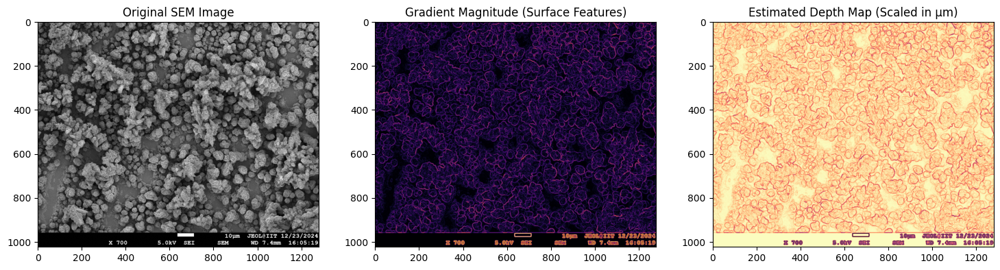

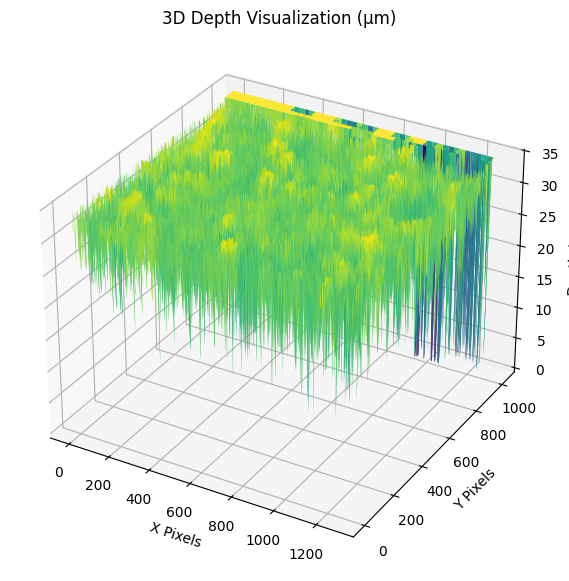

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load image
image_path = "/content/700x.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Gaussian blur to smooth noise
blurred = cv2.GaussianBlur(image, (5, 5), 0)

# Compute gradient in X and Y direction (Sobel filter)
grad_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=5)
grad_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=5)

# Compute gradient magnitude (edge detection, depth estimation)
gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

# Invert intensity for depth estimation (white = high, black = low)
depth_map = 255 - gradient_magnitude.astype(np.uint8)

# Convert depth values to micrometers (1 pixel = 0.135 µm)
depth_map_um = depth_map * (10 / 74)

# Display images
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(image, cmap='gray')
axes[0].set_title("Original SEM Image")
axes[1].imshow(gradient_magnitude, cmap='inferno')
axes[1].set_title("Gradient Magnitude (Surface Features)")
axes[2].imshow(depth_map_um, cmap='magma')
axes[2].set_title("Estimated Depth Map (Scaled in µm)")

plt.show()

# 3D Surface Plot of Depth
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Generate X, Y coordinates
h, w = depth_map_um.shape
X, Y = np.meshgrid(np.arange(w), np.arange(h))

# Plot surface (depth in micrometers)
ax.plot_surface(X, Y, depth_map_um, cmap='viridis', edgecolor='none')
ax.set_title("3D Depth Visualization (µm)")
ax.set_xlabel("X Pixels")
ax.set_ylabel("Y Pixels")
ax.set_zlabel("Depth (µm)")

plt.show()


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Constants
PIXEL_TO_UM = 10 / 74  # µm per pixel
PIXEL_AREA_TO_UM2 = (PIXEL_TO_UM) ** 2  # µm² per pixel²

# Load grayscale image
image_path = "/content/700x.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Compute depth (height) map (assuming darker pixels are higher)
depth_map_um = (255 - image) * PIXEL_TO_UM  # Convert intensity to depth in µm

# Threshold to binarize the image
_, binary_image = cv2.threshold(image, 92, 255, cv2.THRESH_BINARY)

# Find external contours (dendrites)
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Initialize lists
areas_um2 = []
volumes_um3 = []

for cnt in contours:
    area_px = cv2.contourArea(cnt)
    if area_px < 2261:  # Ignore small noise
        continue

    # Compute area in µm²
    area_um2 = area_px * PIXEL_AREA_TO_UM2
    areas_um2.append(area_um2)

    # Create mask for the dendrite
    mask = np.zeros_like(image, dtype=np.uint8)
    cv2.drawContours(mask, [cnt], -1, 255, thickness=cv2.FILLED)

    # Extract height values for the dendrite pixels
    dendrite_heights = depth_map_um[mask == 255]

    # Compute average height (in µm)
    avg_height_um = np.mean(dendrite_heights)

    # Compute volume (Area × Avg Height)
    volume_um3 = area_um2 * avg_height_um
    volumes_um3.append(volume_um3)

# Total volume sum
total_volume = sum(volumes_um3)

# Print results
print(f"Total dendrite volume: {total_volume:.2f} µm³")
print("Individual dendrite volumes (µm³):", [round(v, 2) for v in volumes_um3])


Total dendrite volume: 146211.79 µm³
Individual dendrite volumes (µm³): [np.float64(804.31), np.float64(1161.71), np.float64(1102.06), np.float64(756.4), np.float64(923.92), np.float64(6278.99), np.float64(834.84), np.float64(1007.73), np.float64(4339.75), np.float64(3980.64), np.float64(2356.44), np.float64(10977.19), np.float64(2752.52), np.float64(1113.45), np.float64(8095.28), np.float64(1989.54), np.float64(821.93), np.float64(2039.01), np.float64(672.55), np.float64(1034.85), np.float64(711.25), np.float64(2436.64), np.float64(4969.99), np.float64(881.81), np.float64(16535.78), np.float64(1596.57), np.float64(5920.01), np.float64(2877.16), np.float64(1702.7), np.float64(1352.47), np.float64(919.98), np.float64(1295.3), np.float64(1092.63), np.float64(6775.33), np.float64(1915.52), np.float64(956.29), np.float64(24829.43), np.float64(2381.79), np.float64(739.47), np.float64(7951.24), np.float64(900.16), np.float64(4427.15)]


In [4]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Constants
PIXEL_TO_UM = 10 / 74  # µm per pixel
PIXEL_AREA_TO_UM2 = (PIXEL_TO_UM) ** 2  # µm² per pixel²

# Load grayscale image
image_path = "/content/700x.jpeg"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Compute depth (height) map (assuming darker pixels are higher)
depth_map_um = (255 - image) * PIXEL_TO_UM  # Convert intensity to depth in µm

# Threshold to binarize the image
_, binary_image = cv2.threshold(image, 92, 255, cv2.THRESH_BINARY)

# Find external contours (dendrites)
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Initialize lists for CSV output
data = []

for cnt in contours:
    area_px = cv2.contourArea(cnt)
    if area_px < 2261:  # Ignore small noise
        continue

    # Compute area in µm²
    area_um2 = area_px * PIXEL_AREA_TO_UM2

    # Compute centroid (X, Y) in µm
    M = cv2.moments(cnt)
    if M["m00"] != 0:
        centroid_x_um = (M["m10"] / M["m00"]) * PIXEL_TO_UM
        centroid_y_um = (M["m01"] / M["m00"]) * PIXEL_TO_UM
    else:
        continue

    # Create mask for the dendrite
    mask = np.zeros_like(image, dtype=np.uint8)
    cv2.drawContours(mask, [cnt], -1, 255, thickness=cv2.FILLED)

    # Extract height values for the dendrite pixels
    dendrite_heights = depth_map_um[mask == 255]

    # Compute average height (in µm)
    avg_height_um = np.mean(dendrite_heights)

    # Compute volume (Area × Avg Height)
    volume_um3 = area_um2 * avg_height_um

    # Append to data list
    data.append([centroid_x_um, centroid_y_um, area_um2, avg_height_um, volume_um3])

# Convert to DataFrame
df = pd.DataFrame(data, columns=["X (µm)", "Y (µm)", "Area (µm²)", "Height (µm)", "Volume (µm³)"])

# Save to CSV
csv_path = "dendrite_analysis.csv"
df.to_csv(csv_path, index=False)

# Print confirmation
print(f"CSV file saved: {csv_path}")

# Display first few rows
print(df.head())


CSV file saved: dendrite_analysis.csv
       X (µm)      Y (µm)  Area (µm²)  Height (µm)  Volume (µm³)
0   80.523317  126.221153   48.739956    16.501988    804.306185
1  100.913564  122.613725   69.895909    16.620590   1161.711257
2   49.219302  122.580244   57.624178    19.124893   1102.056248
3  118.630004  119.372512   45.023740    16.800091    756.402910
4   37.785076  116.058618   55.003652    16.797497    923.923665


FileUpload(value={}, accept='image/*', description='Upload')

✅ CSV file saved as 'dendrite_data.csv'.


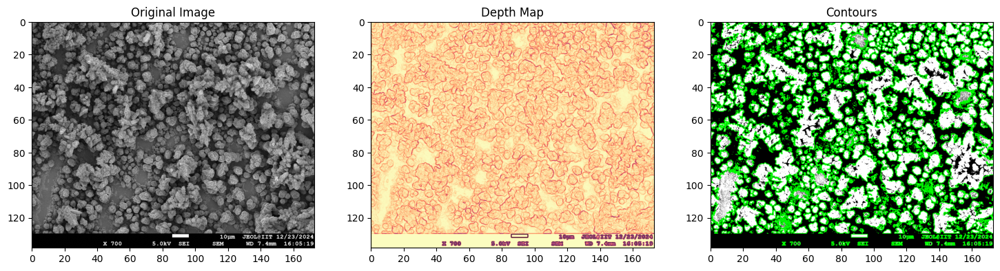

In [17]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display
from io import BytesIO

# Constants
PIXEL_TO_UM = 10 / 74  # µm per pixel
PIXEL_AREA_TO_UM2 = (PIXEL_TO_UM) ** 2  # µm² per pixel²

# File uploader
uploader = widgets.FileUpload(accept='image/*', multiple=False)
display(uploader)

def process_image(change):
    if uploader.value:
        uploaded_file = list(uploader.value.values())[0]
        image_bytes = uploaded_file['content']

        # Read image from bytes
        image_array = np.frombuffer(image_bytes, dtype=np.uint8)
        image = cv2.imdecode(image_array, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print("Error loading image! Ensure the file is a valid image.")
            return

        # Convert pixel dimensions to µm
        height_px, width_px = image.shape
        width_um = width_px * PIXEL_TO_UM
        height_um = height_px * PIXEL_TO_UM

        # Apply Gaussian blur
        blurred = cv2.GaussianBlur(image, (5, 5), 0)

        # Compute gradient magnitude (depth estimation)
        grad_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=5)
        grad_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=5)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
        gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)
        depth_map = 255 - gradient_magnitude.astype(np.uint8)

        # Thresholding for segmentation
        _, binary_image = cv2.threshold(image, 92, 255, cv2.THRESH_BINARY)

        # Find external contours
        contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Analyze contours
        data = []
        for cnt in contours:
            area_px = cv2.contourArea(cnt)
            if area_px < 2261:  # Ignore small noise
                continue

            M = cv2.moments(cnt)
            if M["m00"] != 0:
                cx = M["m10"] / M["m00"] * PIXEL_TO_UM
                cy = M["m01"] / M["m00"] * PIXEL_TO_UM
                area_um2 = area_px * PIXEL_AREA_TO_UM2
                avg_height_um = np.mean(depth_map) * (10 / 255)  # Normalize depth (0-10 µm)
                volume_um3 = area_um2 * avg_height_um

                data.append([cx, cy, area_um2, avg_height_um, volume_um3])

        # Save data to CSV
        df = pd.DataFrame(data, columns=["X (µm)", "Y (µm)", "Area (µm²)", "Height (µm)", "Volume (µm³)"])
        df.to_csv("dendrite_data.csv", index=False)
        print("✅ CSV file saved as 'dendrite_data.csv'.")

        # Visualization
        binary_bgr = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(binary_bgr, contours, -1, (0, 255, 0), 2)

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        extent = [0, width_um, height_um, 0]

        axes[0].imshow(image, cmap='gray', extent=extent)
        axes[0].set_title('Original Image')

        axes[1].imshow(depth_map, cmap='magma', extent=extent)
        axes[1].set_title('Depth Map')

        axes[2].imshow(binary_bgr, extent=extent)
        axes[2].set_title('Contours')

        plt.show()

# Attach the function to the uploader
uploader.observe(process_image, names='value')


FileUpload(value={}, accept='image/*', description='Upload')

✅ CSV file saved as 'dendrite_data.csv'.


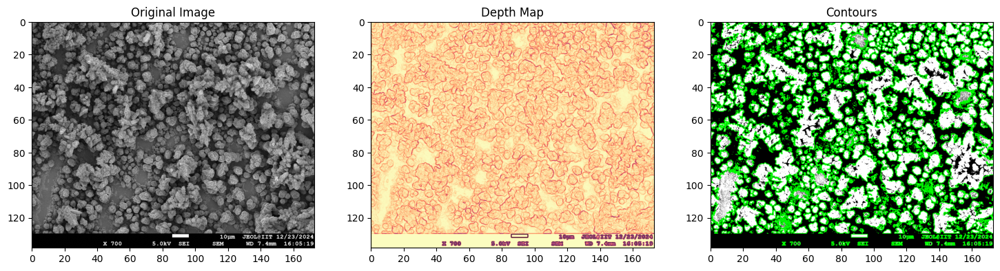

In [18]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

# Constants
PIXEL_TO_UM = 10 / 74  # µm per pixel
PIXEL_AREA_TO_UM2 = (PIXEL_TO_UM) ** 2  # µm² per pixel²

# File uploader
uploader = widgets.FileUpload(accept='image/*', multiple=False)
display(uploader)

def process_image(change):
    if uploader.value:
        uploaded_file = list(uploader.value.values())[0]
        image_bytes = uploaded_file['content']

        # Read image from bytes
        image_array = np.frombuffer(image_bytes, dtype=np.uint8)
        image = cv2.imdecode(image_array, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print("Error loading image! Ensure the file is a valid image.")
            return

        # Convert pixel dimensions to µm
        height_px, width_px = image.shape
        width_um = width_px * PIXEL_TO_UM
        height_um = height_px * PIXEL_TO_UM

        # Apply Gaussian blur
        blurred = cv2.GaussianBlur(image, (5, 5), 0)

        # Compute gradient magnitude (depth estimation)
        grad_x = cv2.Sobel(blurred, cv2.CV_64F, 1, 0, ksize=5)
        grad_y = cv2.Sobel(blurred, cv2.CV_64F, 0, 1, ksize=5)
        gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
        gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)
        depth_map = 255 - gradient_magnitude.astype(np.uint8)

        # Thresholding for segmentation
        _, binary_image = cv2.threshold(image, 92, 255, cv2.THRESH_BINARY)

        # Find external contours
        contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Analyze contours
        data = []
        for cnt in contours:
            area_px = cv2.contourArea(cnt)
            if area_px < 2261:  # Ignore small noise
                continue

            M = cv2.moments(cnt)
            if M["m00"] != 0:
                cx = (M["m10"] / M["m00"]) * PIXEL_TO_UM
                cy = (M["m01"] / M["m00"]) * PIXEL_TO_UM
                area_um2 = area_px * PIXEL_AREA_TO_UM2
                avg_height_um = np.mean(depth_map) * (10 / 255)  # Normalize depth (0-10 µm)
                volume_um3 = area_um2 * avg_height_um

                data.append([round(cx, 3), round(cy, 3), round(area_um2, 3), round(avg_height_um, 3), round(volume_um3, 3)])

        # Save data to CSV
        df = pd.DataFrame(data, columns=["X (µm)", "Y (µm)", "Area (µm²)", "Height (µm)", "Volume (µm³)"])
        df.to_csv("dendrite_data.csv", index=False)
        print("✅ CSV file saved as 'dendrite_data.csv'.")

        # Visualization
        binary_bgr = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(binary_bgr, contours, -1, (0, 255, 0), 2)

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        extent = [0, width_um, height_um, 0]

        axes[0].imshow(image, cmap='gray', extent=extent)
        axes[0].set_title('Original Image')

        axes[1].imshow(depth_map, cmap='magma', extent=extent)
        axes[1].set_title('Depth Map')

        axes[2].imshow(binary_bgr, extent=extent)
        axes[2].set_title('Contours')

        plt.show()

# Attach the function to the uploader
uploader.observe(process_image, names='value')


FileUpload(value={}, accept='image/*', description='Upload')

✅ CSV file saved as 'dendrite_data.csv'.


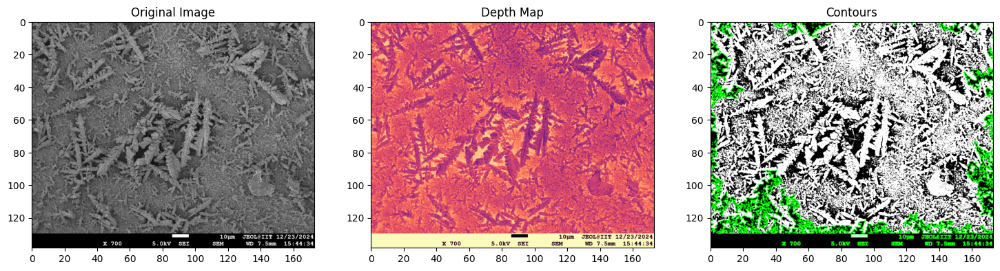

In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

# Constants
PIXEL_TO_UM = 10 / 74  # µm per pixel
PIXEL_AREA_TO_UM2 = PIXEL_TO_UM ** 2  # µm² per pixel²

# File uploader
uploader = widgets.FileUpload(accept='image/*', multiple=False)
display(uploader)

def process_image(change):
    if uploader.value:
        uploaded_file = list(uploader.value.values())[0]
        image_bytes = uploaded_file['content']

        # Read image from bytes
        image_array = np.frombuffer(image_bytes, dtype=np.uint8)
        image = cv2.imdecode(image_array, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print("Error loading image! Ensure the file is a valid image.")
            return

        # Convert pixel dimensions to µm
        height_px, width_px = image.shape
        width_um = width_px * PIXEL_TO_UM
        height_um = height_px * PIXEL_TO_UM

        # Compute depth (height) map
        depth_map_um = (255 - image) * PIXEL_TO_UM  # Convert intensity to depth in µm

        # Thresholding for segmentation
        _, binary_image = cv2.threshold(image, 92, 255, cv2.THRESH_BINARY)

        # Find external contours
        contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # Analyze contours
        data = []
        for cnt in contours:
            area_px = cv2.contourArea(cnt)
            if area_px < 2261:  # Ignore small noise
                continue

            # Compute area in µm²
            area_um2 = area_px * PIXEL_AREA_TO_UM2

            # Compute centroid (X, Y) in µm
            M = cv2.moments(cnt)
            if M["m00"] != 0:
                cx = (M["m10"] / M["m00"]) * PIXEL_TO_UM
                cy = (M["m01"] / M["m00"]) * PIXEL_TO_UM
            else:
                continue

            # Create mask for the dendrite
            mask = np.zeros_like(image, dtype=np.uint8)
            cv2.drawContours(mask, [cnt], -1, 255, thickness=cv2.FILLED)

            # Extract height values for the dendrite pixels
            dendrite_heights = depth_map_um[mask == 255]

            # Compute average height (in µm)
            avg_height_um = np.mean(dendrite_heights)

            # Compute volume (Area × Avg Height)
            volume_um3 = area_um2 * avg_height_um

            # Append to data list (rounded to 3 decimal places)
            data.append([round(cx, 3), round(cy, 3), round(area_um2, 3), round(avg_height_um, 3), round(volume_um3, 3)])

        # Save data to CSV
        df = pd.DataFrame(data, columns=["X (µm)", "Y (µm)", "Area (µm²)", "Height (µm)", "Volume (µm³)"])
        df.to_csv("dendrite_data.csv", index=False)
        print("✅ CSV file saved as 'dendrite_data.csv'.")

        # Visualization
        binary_bgr = cv2.cvtColor(binary_image, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(binary_bgr, contours, -1, (0, 255, 0), 2)

        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        extent = [0, width_um, height_um, 0]

        axes[0].imshow(image, cmap='gray', extent=extent)
        axes[0].set_title('Original Image')

        axes[1].imshow(depth_map_um, cmap='magma', extent=extent)
        axes[1].set_title('Depth Map')

        axes[2].imshow(binary_bgr, extent=extent)
        axes[2].set_title('Contours')

        plt.show()

# Attach the function to the uploader
uploader.observe(process_image, names='value')


In [5]:
import pandas as pd

# Load the CSV file
csv_path = "/content/dendrite_data.csv"  # Ensure the correct filename
df = pd.read_csv(csv_path)

# Find the maximum height
max_height_um = df["Height (µm)"].max()

print(f"📏 Maximum dendrite height: {max_height_um:.3f} µm")


📏 Maximum dendrite height: 20.024 µm


In [ ]:
# Install required libraries
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install opencv-python-headless

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-wm7rqo66
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-wm7rqo66
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done


In [ ]:
# Install PyTorch (if not already installed)
!pip install torch torchvision


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 105.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 82.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [ ]:
# Download the SAM model weights
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

--2025-03-22 04:25:25--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 108.138.94.124, 108.138.94.118, 108.138.94.49, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|108.138.94.124|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G  57.6MB/s    in 29s     

2025-03-22 04:25:54 (83.6 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [ ]:
from PIL import Image
import os

def convert_bmp_to_jpeg(input_path):
    # Extract directory and base filename
    base_name = os.path.splitext(os.path.basename(input_path))[0]
    dir_name = os.path.dirname(input_path)

    # Construct output path with same name, .jpeg extension
    output_path = os.path.join(dir_name, base_name + ".jpeg")

    # Open and convert the image
    with Image.open(input_path) as img:
        rgb_img = img.convert("RGB")
        rgb_img.save(output_path, "JPEG")
        print(f"Converted: {input_path} → {output_path}")

# Example usage
convert_bmp_to_jpeg("/content/700x (2).bmp")


Converted: /content/700x (2).bmp → /content/700x (2).jpeg


Saving 700x-_2_.jpeg to 700x-_2_ (1).jpeg


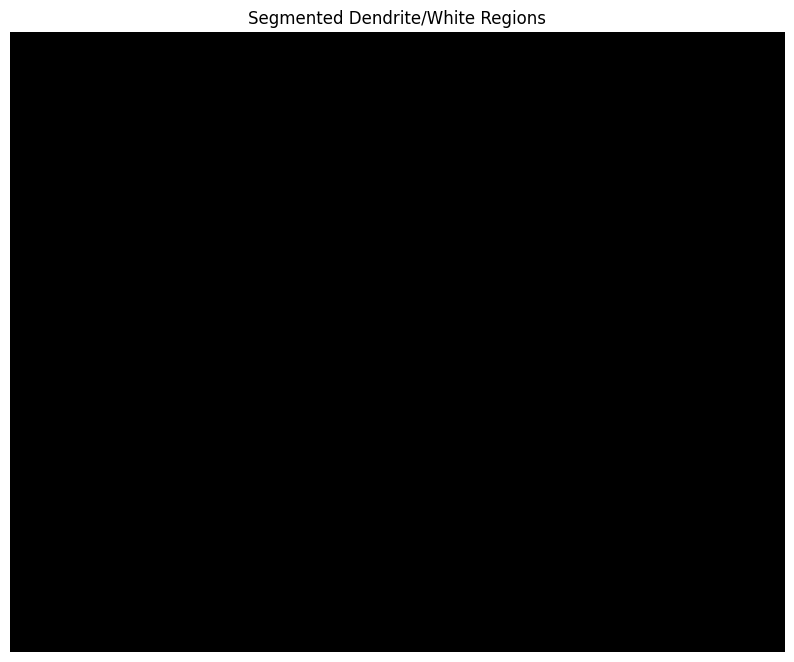

In [ ]:
# --- Install dependencies if not already ---
# !pip install git+https://github.com/facebookresearch/segment-anything.git
# !pip install opencv-python matplotlib

import cv2
import numpy as np
import torch
from google.colab import files
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamPredictor

# --- Step 1: Upload the image ---
uploaded = files.upload()
for image_name in uploaded.keys():
    image = cv2.imdecode(np.frombuffer(uploaded[image_name], np.uint8), cv2.IMREAD_COLOR)

# --- Step 2: Load SAM model ---
device = "cuda" if torch.cuda.is_available() else "cpu"
sam_checkpoint = "sam_vit_h_4b8939.pth"  # Manually upload to Colab
model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint).to(device)
predictor = SamPredictor(sam)

# --- Step 3: Segment white/dendrite regions ---
predictor.set_image(image)
masks, _, _ = predictor.predict()

# Combine only bright/white regions from all masks
segmented_mask = np.zeros(image.shape[:2], dtype=np.uint8)
for mask in masks:
    temp_mask = mask.astype(np.uint8)
    masked_img = cv2.bitwise_and(image, image, mask=temp_mask * 255)
    gray_masked = cv2.cvtColor(masked_img, cv2.COLOR_BGR2GRAY)
    mean_intensity = cv2.mean(gray_masked, mask=temp_mask)[0]

    if mean_intensity > 200:  # Keep bright masks (dendrite/white)
        segmented_mask = cv2.bitwise_or(segmented_mask, temp_mask)

# Apply the final mask
segmented_image = cv2.bitwise_and(image, image, mask=segmented_mask * 255)

# --- Step 4: Display segmented image ---
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
plt.title("Segmented Dendrite/White Regions")
plt.axis('off')
plt.show()
